In [1]:
#This cell imports the required modules to the notebook
#RUN THIS CELL BEFORE ANY OTHER CODE IS RUN
import matplotlib.pyplot as plt     #imports graph plotting library
import astropy.io.fits as ast       #imports FITS manipulation library
import numpy as np                  #imports numerical manipulation library
import random                       #imports module to generate random numbers for monte carlo error propagation
import csv

#magic function that forces plots to appear in this notebook
%matplotlib inline                  
plt.ion()                           #function that loads plotting library in "interactive mode"

from astropy.utils.data import get_pkg_data_filename   #imports function to get filename of data file
from scipy.stats import sem

print("Required Libraries Loaded Successfully")

def graderr(R, err, n): #user defined function does monte carlo error propagation
    """
    function for calculating the error in the gradient, using a monte carlo error propagation philosophy
    """
    grads = [[] for count in range(n)]                 #initialises list of lists, with indices [iteration][latitude]
    for i in range(n):                                 #loops through randomisation process n times
        randR = np.zeros(len(R))                       #initialises list of random R values
        for j in range(len(R)):                        #loops through the random function to form the list
            randR[j] = random.uniform(R[j]-err[j], R[j]+err[j]) #generates random number within bounds of error bars
        grads[i] = np.gradient(randR)                  #finds the gradient of the random R list generated above
        
    graderr = np.zeros(len(R))                         #initialises the list of gradient errors
    for i in range(len(R)):                            #loops through list of error calculation from the lists of random R
        gradforpoint = np.zeros(n)                     #initialises restructured list of iterations of grad, index [latitude]
        for j in range(n):                             #loops through the iterations
            gradforpoint[j] = grads[j][i]              #gets the gradR error through each iteration and makes a new list from it
        graderr[i] = (max(gradforpoint)-min(gradforpoint))/2 #calculates error by finding the mean of the max and min errors
    return(graderr)                                    #returns list of errors

from OPALRefFunc import *
print("User-Defined Functions Loaded Successfully")

latlimits = [40,-90] #values for latitude chosen
degpererrbar = 1    #chosen
print("Graphical Parameters Initialised")

Required Libraries Loaded Successfully
User-Defined Functions Loaded Successfully
Graphical Parameters Initialised


# Year 2015 (Cycle 22)

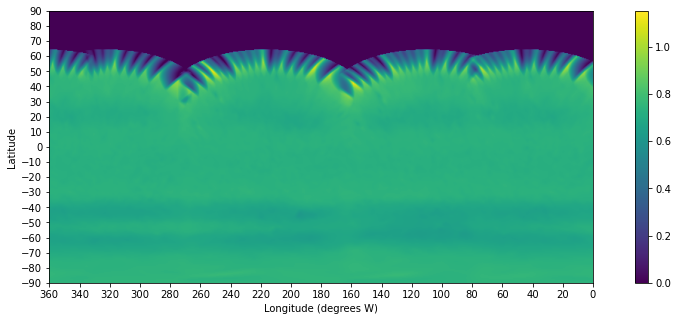

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


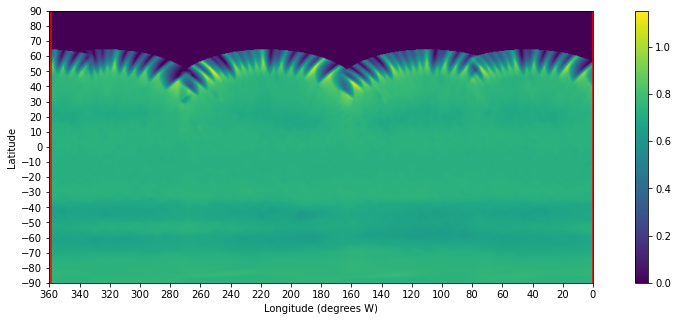

Is this longitude range appropriate? (y/n): y


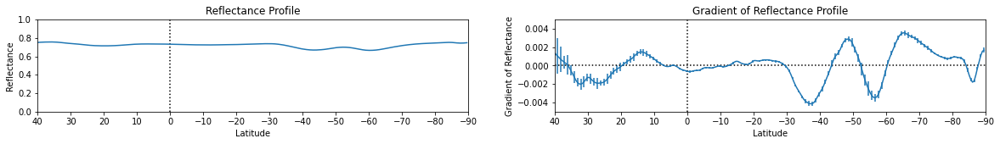

Data Successfully Written to: plotdata/2015_467.csv


In [4]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_22/F467M_22_A.fits')
data = ast.getdata(file,ext=0)*0.00715
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

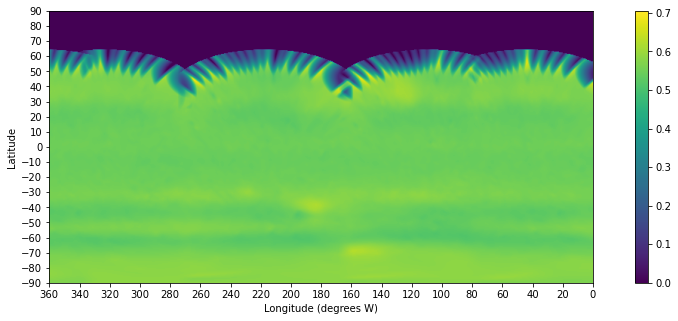

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


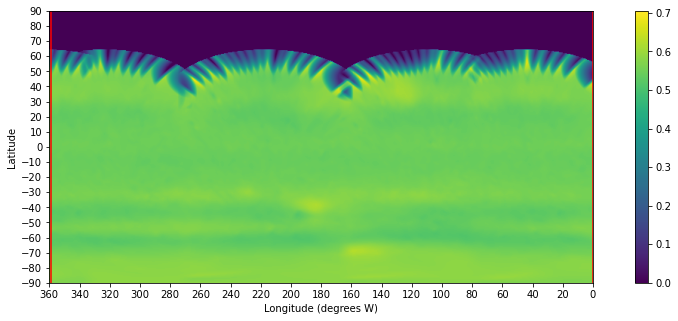

Is this longitude range appropriate? (y/n): y


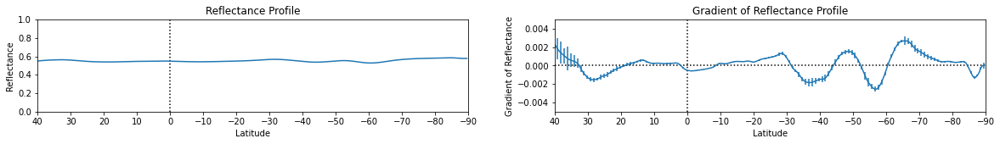

Data Successfully Written to: plotdata/2015_547.csv


In [3]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_22/F547M_22_A.fits')
data = ast.getdata(file,ext=0)*0.00295
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

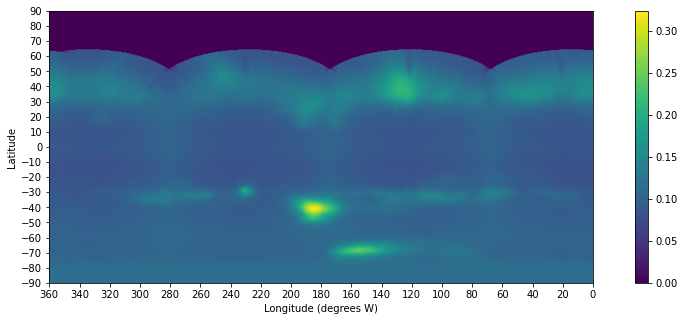

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


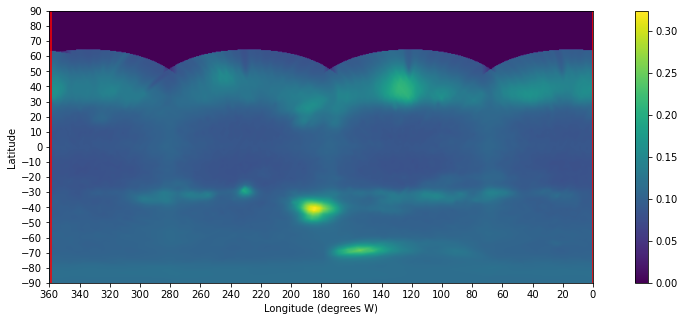

Is this longitude range appropriate? (y/n): y


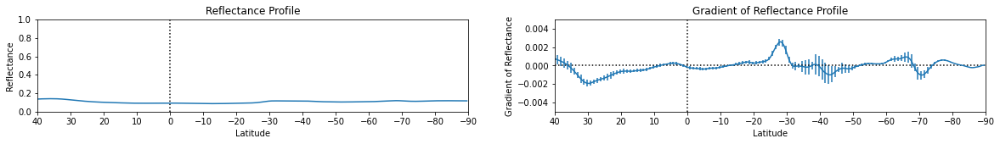

Data Successfully Written to: plotdata/2015_619.csv


In [4]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_22/FQ619N_22_A.fits')
data = ast.getdata(file,ext=0)*0.00160
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

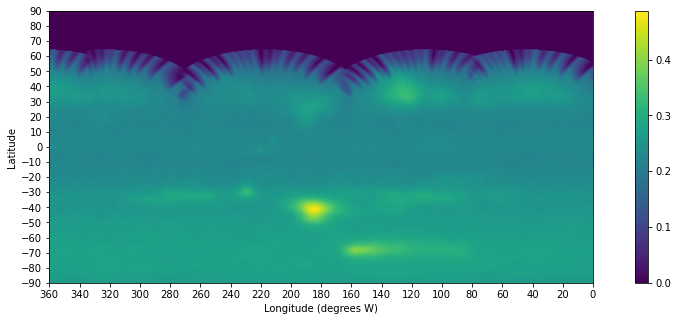

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


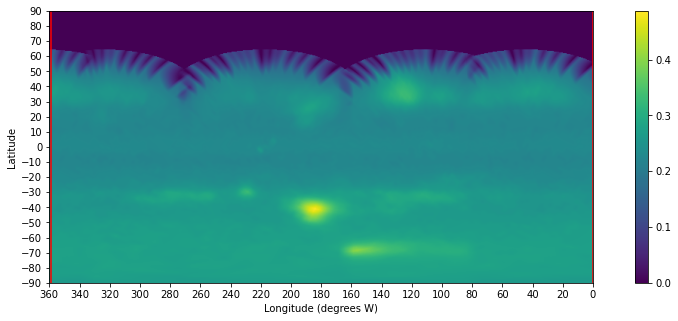

Is this longitude range appropriate? (y/n): y


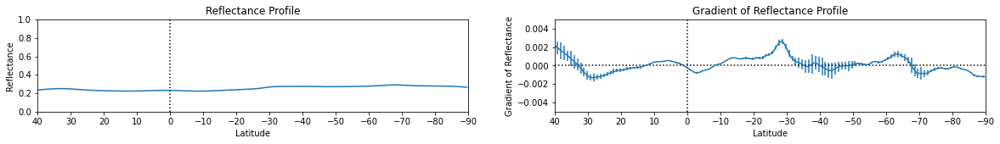

Data Successfully Written to: plotdata/2015_657.csv


In [5]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_22/F657N_22_A.fits')
data = ast.getdata(file,ext=0)*0.00529
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

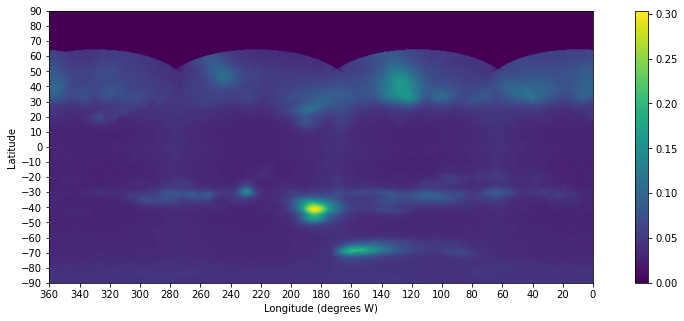

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


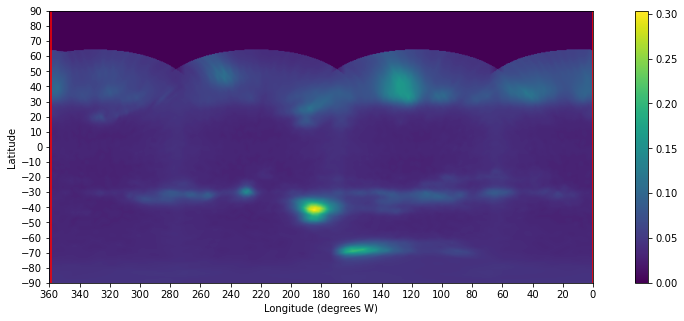

Is this longitude range appropriate? (y/n): y


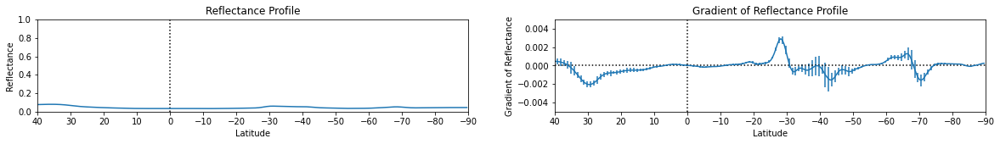

Data Successfully Written to: plotdata/2015_727.csv


In [6]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_22/FQ727N_22_A.fits')
data = ast.getdata(file,ext=0)*0.00203
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

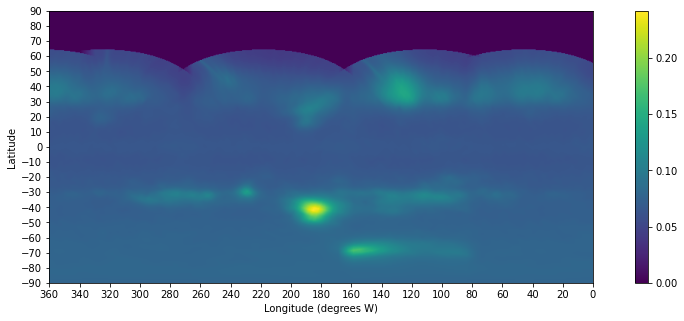

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


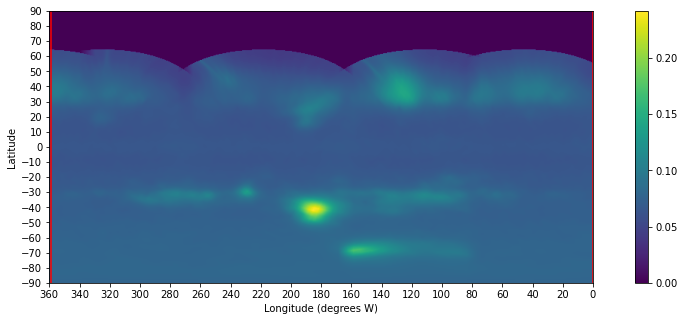

Is this longitude range appropriate? (y/n): y


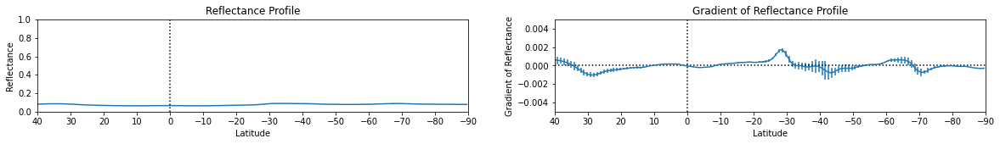

Data Successfully Written to: plotdata/2015_763.csv


In [7]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_22/F763M_22_A.fits')
data = ast.getdata(file,ext=0)*0.00146
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

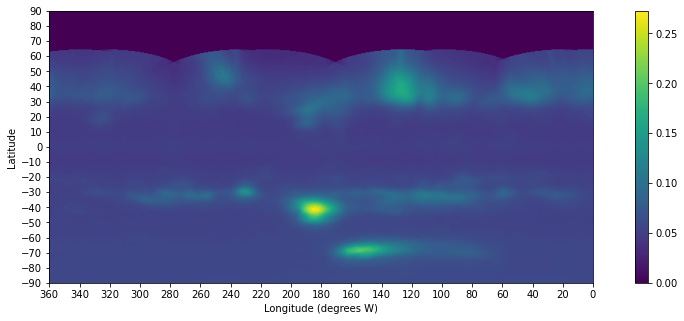

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


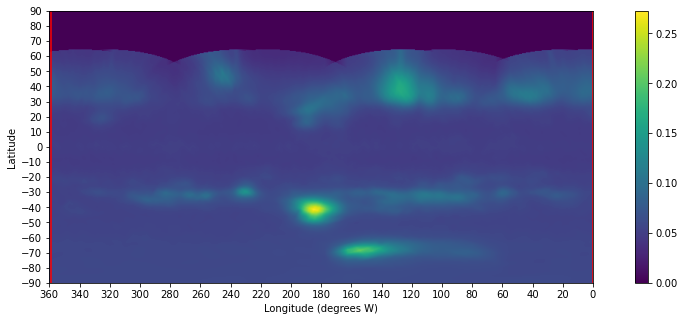

Is this longitude range appropriate? (y/n): y


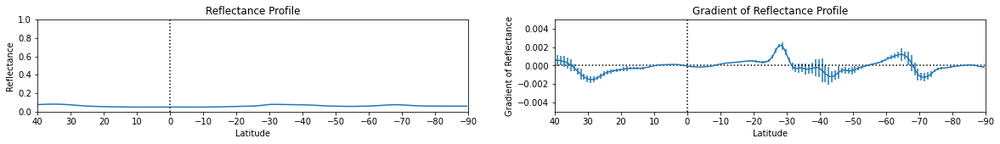

Data Successfully Written to: plotdata/2015_845.csv


In [8]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_22/F845M_22_A.fits')
data = ast.getdata(file,ext=0)*0.00135
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2016 (Cycle 23)

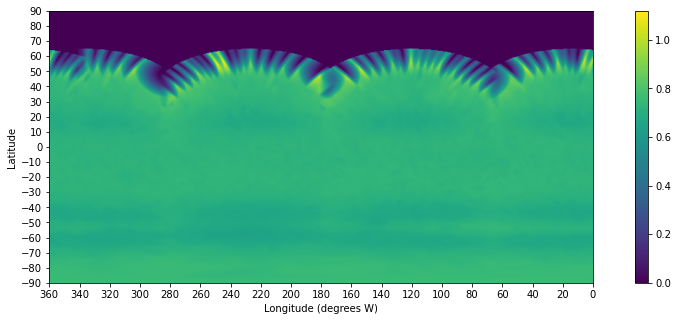

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


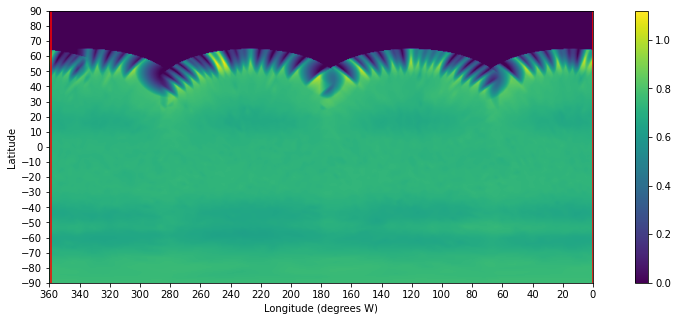

Is this longitude range appropriate? (y/n): y


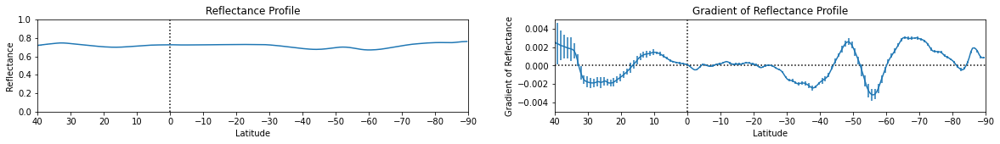

Data Successfully Written to: plotdata/2016_467.csv


In [9]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_23/F467M_23_A.fits')
data = ast.getdata(file,ext=0)*0.00475
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

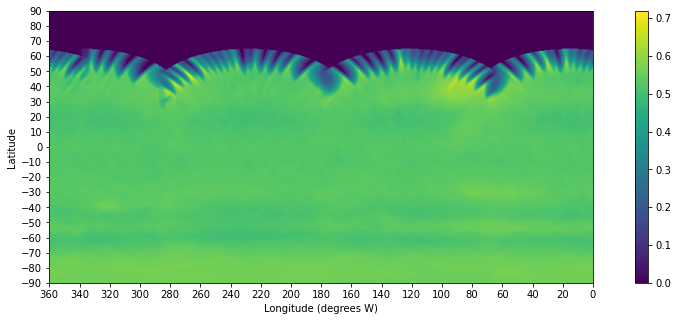

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


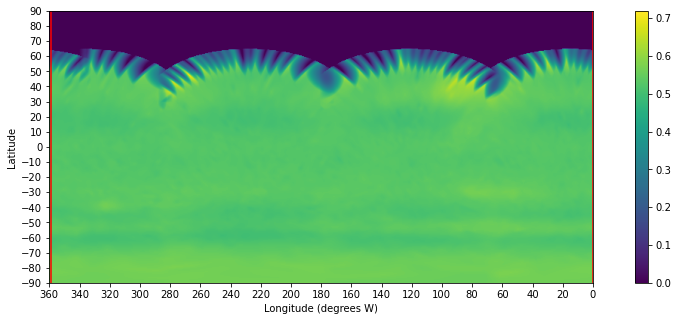

Is this longitude range appropriate? (y/n): y


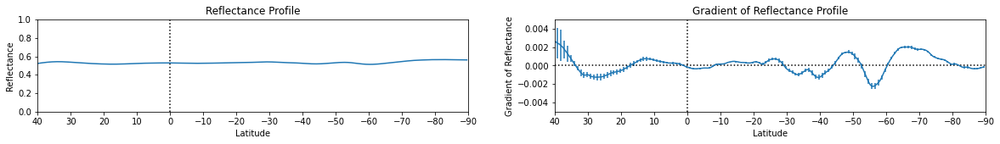

Data Successfully Written to: plotdata/2016_547.csv


In [10]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_23/F547M_23_A.fits')
data = ast.getdata(file,ext=0)*0.00249
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

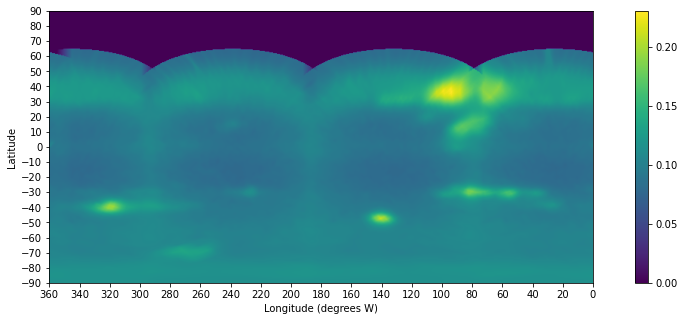

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


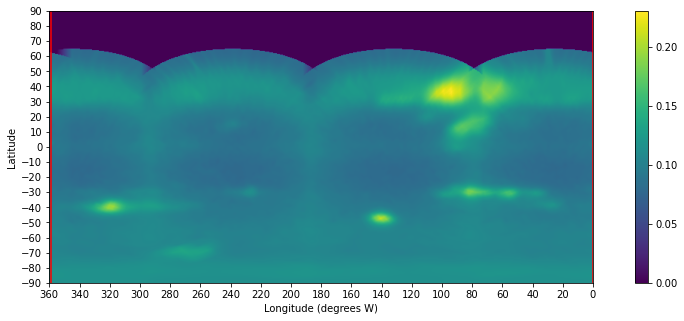

Is this longitude range appropriate? (y/n): y


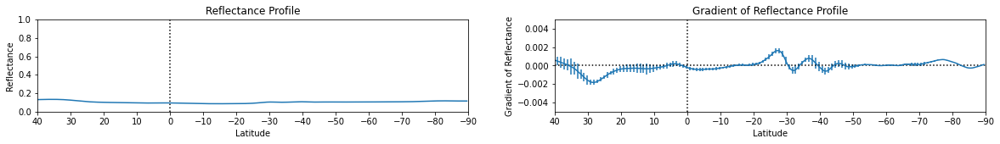

Data Successfully Written to: plotdata/2016_619.csv


In [11]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_23/FQ619N_23_A.fits')
data = ast.getdata(file,ext=0)*0.00160
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

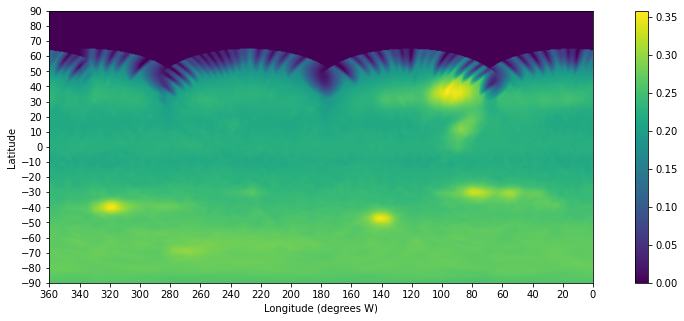

Please input the leftmost longitude of the range desired: 59
Please input the rightmost longitude of the range desired: 0


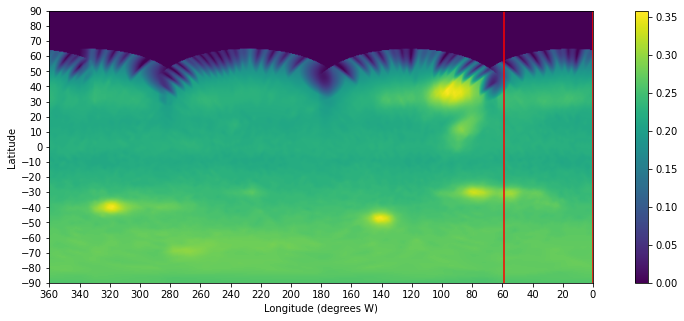

Is this longitude range appropriate? (y/n): n
Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


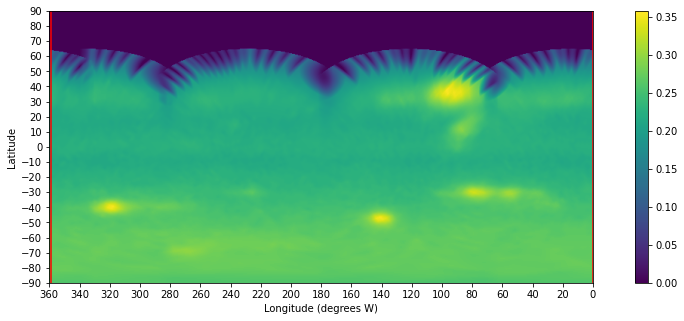

Is this longitude range appropriate? (y/n): y


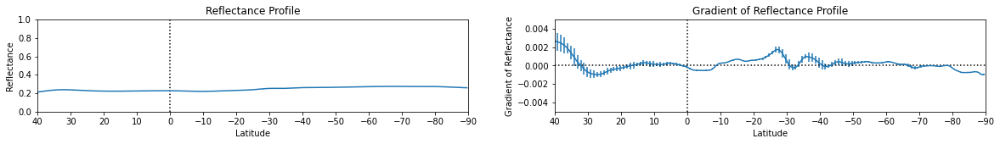

Data Successfully Written to: plotdata/2016_657.csv


In [12]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_23/F657N_23_A.fits')
data = ast.getdata(file,ext=0)*0.00406
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

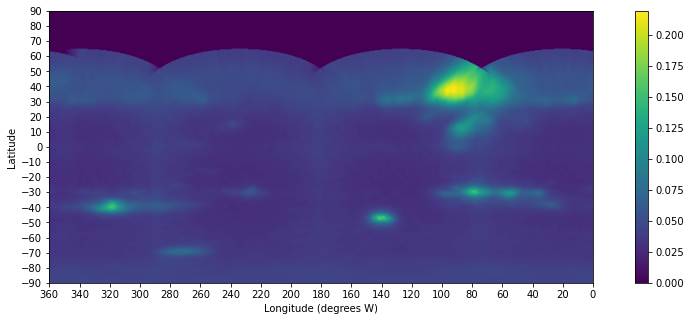

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


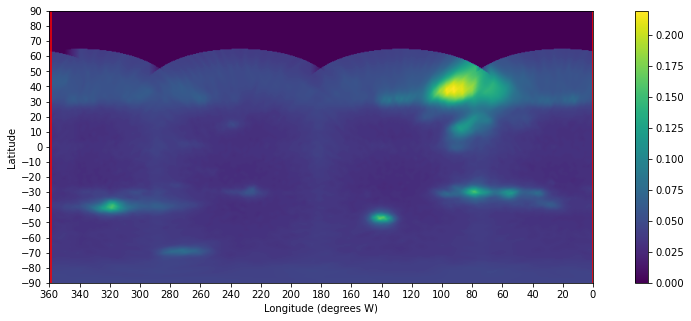

Is this longitude range appropriate? (y/n): y


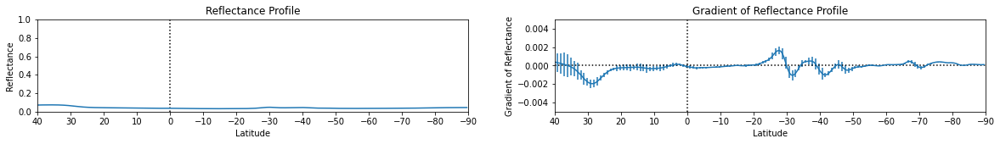

Data Successfully Written to: plotdata/2016_727.csv


In [13]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_23/FQ727N_23_A.fits')
data = ast.getdata(file,ext=0)*0.00203
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

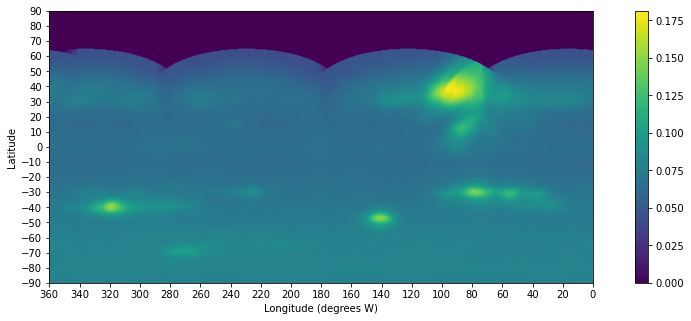

Please input the leftmost longitude of the range desired: 35
Please input the rightmost longitude of the range desired: 0


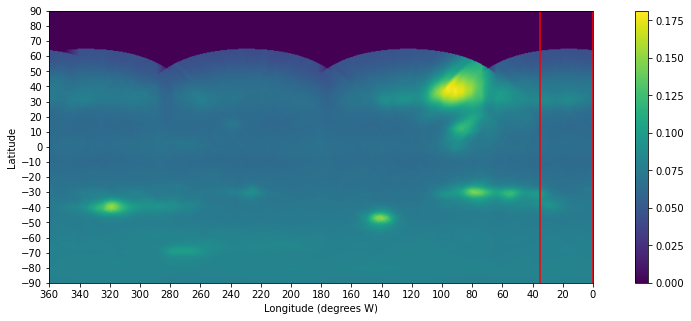

Is this longitude range appropriate? (y/n): n
Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


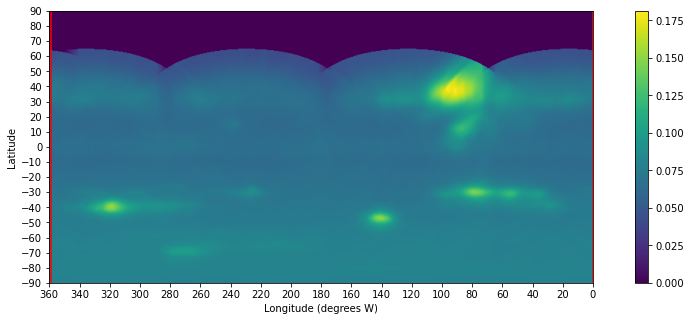

Is this longitude range appropriate? (y/n): y


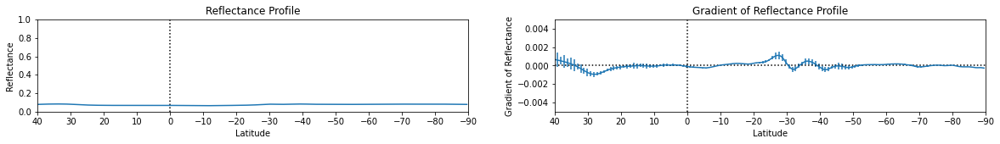

Data Successfully Written to: plotdata/2016_763.csv


In [14]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_23/F763M_23_A.fits')
data = ast.getdata(file,ext=0)*0.00145
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

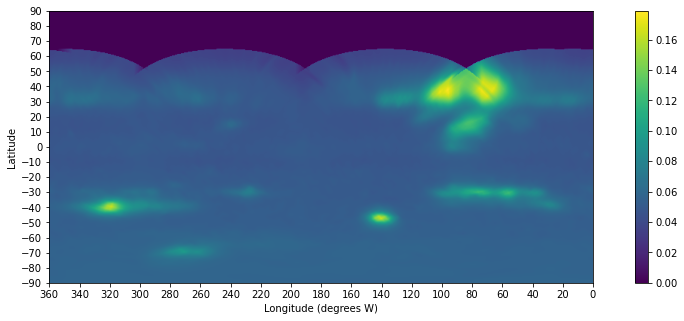

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


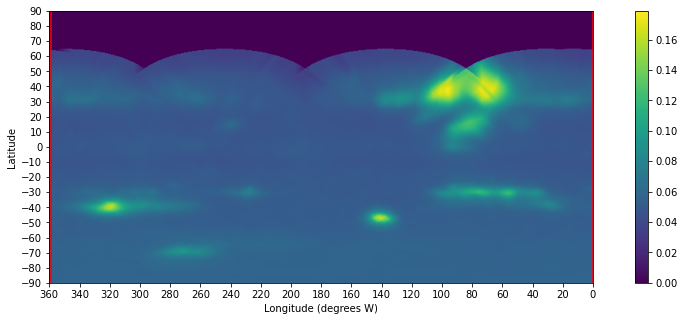

Is this longitude range appropriate? (y/n): y


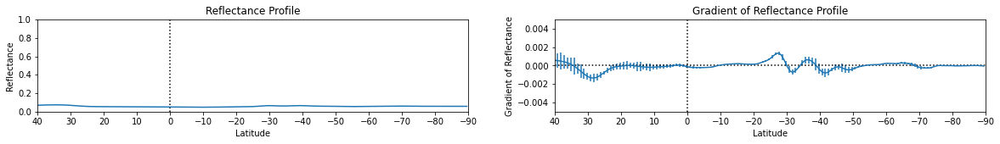

Data Successfully Written to: plotdata/2016_845.csv


In [15]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_23/F845M_23_A.fits')
data = ast.getdata(file,ext=0)*0.00130
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2017 (Cycle 24)

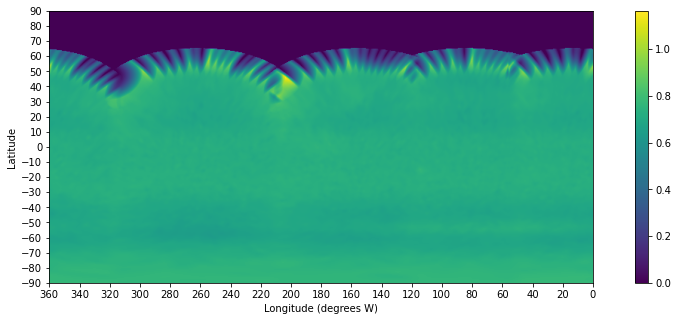

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


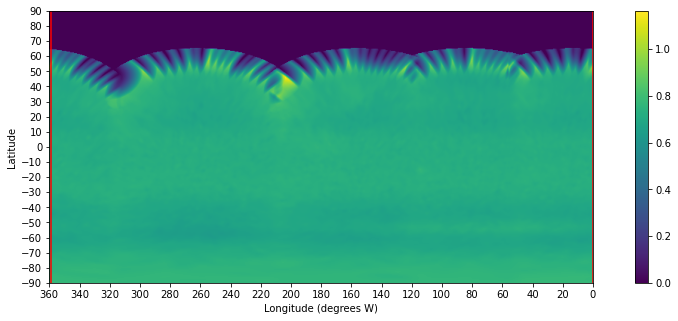

Is this longitude range appropriate? (y/n): y


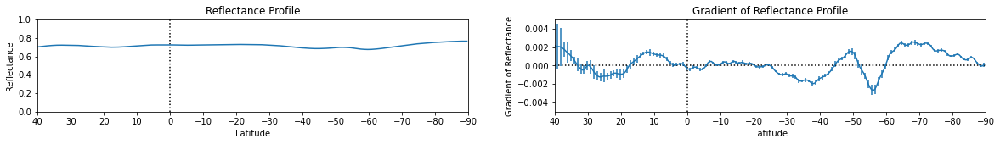

Data Successfully Written to: plotdata/2017_467.csv


In [16]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_24/F467M_24_A.fits')
data = ast.getdata(file,ext=0)*0.00475
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

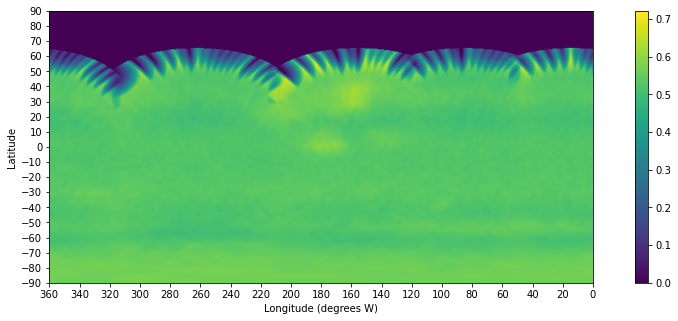

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


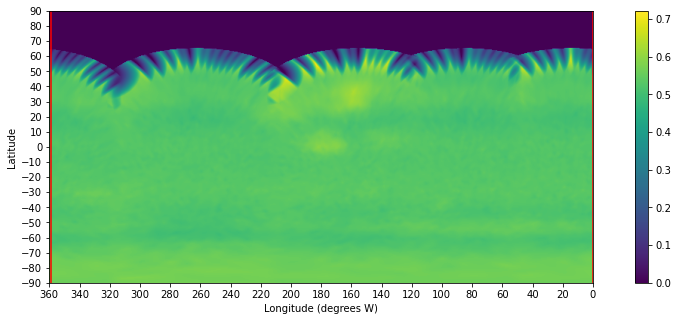

Is this longitude range appropriate? (y/n): y


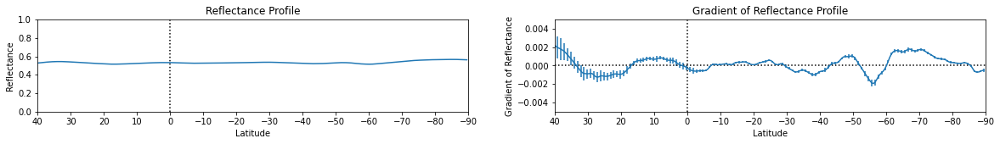

Data Successfully Written to: plotdata/2017_547.csv


In [17]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_24/F547M_24_A.fits')
data = ast.getdata(file,ext=0)*0.00249
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

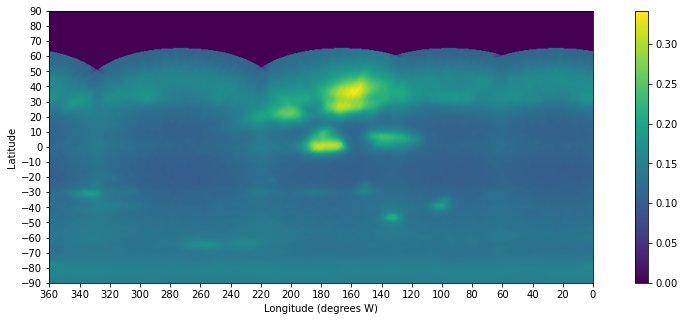

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


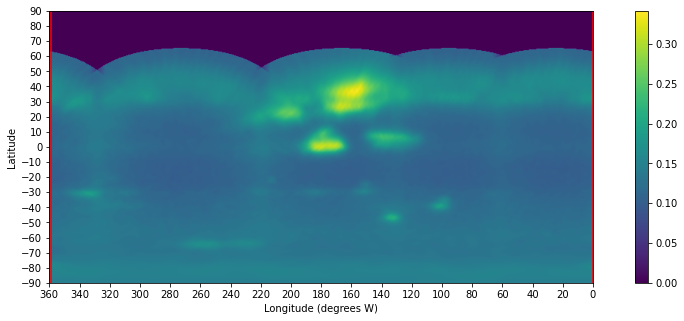

Is this longitude range appropriate? (y/n): y


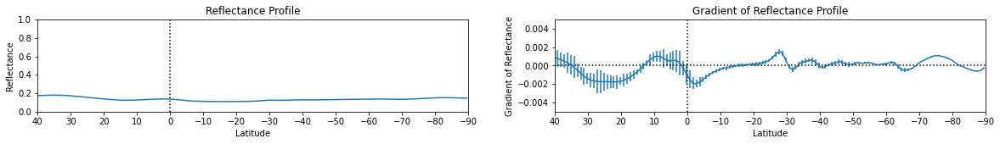

Data Successfully Written to: plotdata/2017_619.csv


In [18]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_24/FQ619N_24_A.fits')
data = ast.getdata(file,ext=0)*0.00205
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

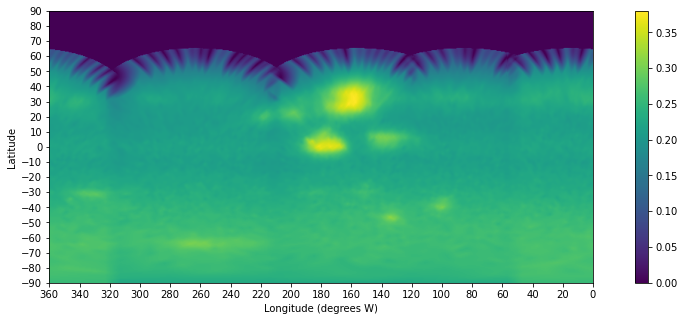

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


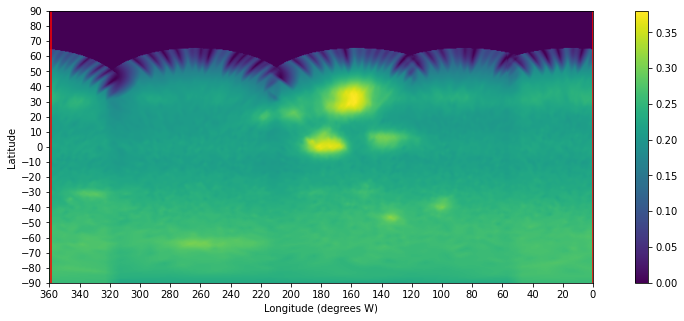

Is this longitude range appropriate? (y/n): y


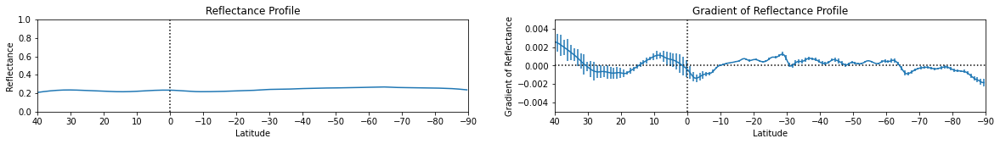

Data Successfully Written to: plotdata/2017_657.csv


In [19]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_24/F657N_24_A.fits')
data = ast.getdata(file,ext=0)*0.00405
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

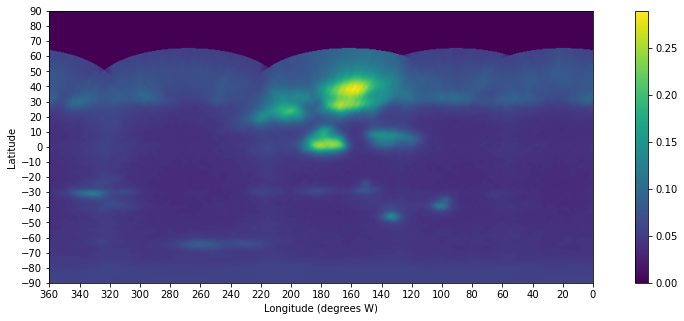

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


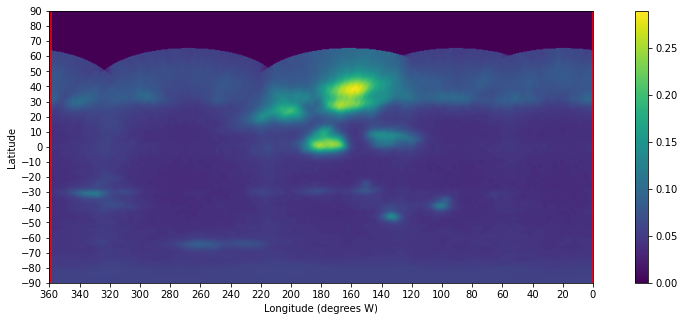

Is this longitude range appropriate? (y/n): y


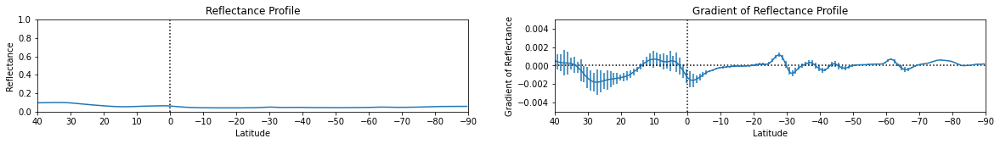

Data Successfully Written to: plotdata/2017_727.csv


In [20]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_24/FQ727N_24_A.fits')
data = ast.getdata(file,ext=0)*0.00260
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

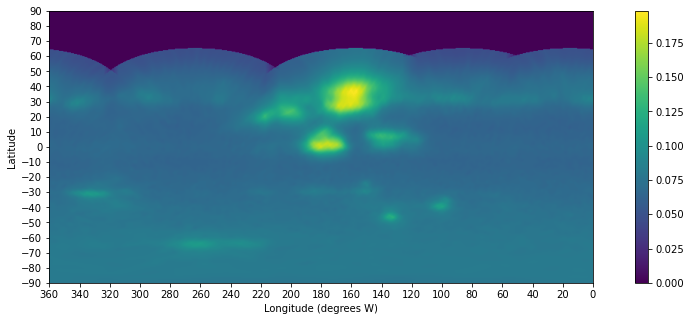

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


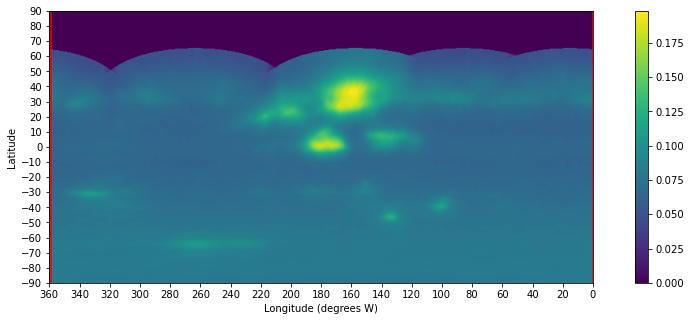

Is this longitude range appropriate? (y/n): y


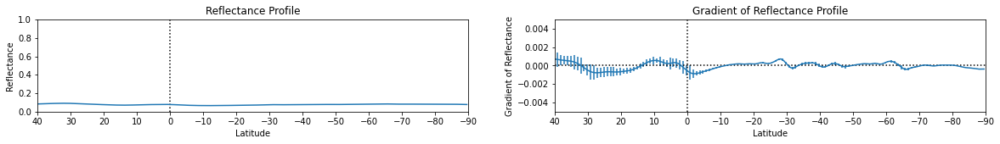

Data Successfully Written to: plotdata/2017_763.csv


In [21]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_24/F763M_24_A.fits')
data = ast.getdata(file,ext=0)*0.00145
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

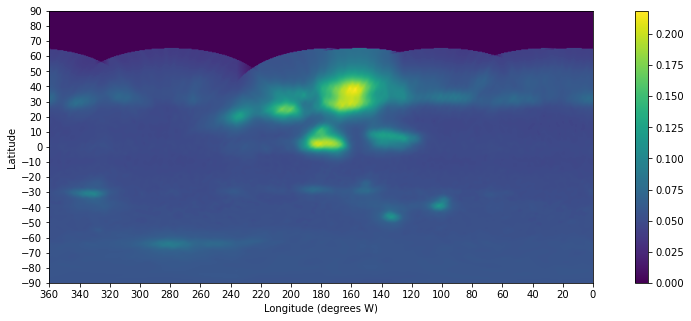

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


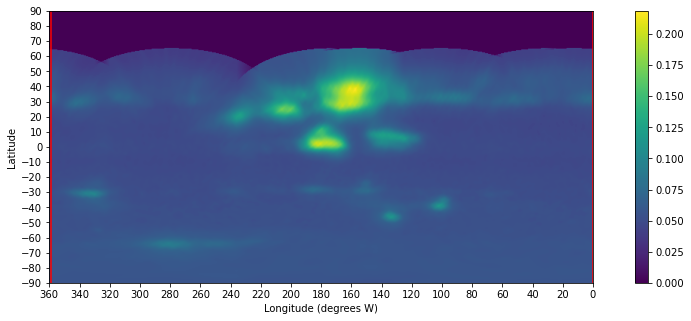

Is this longitude range appropriate? (y/n): y


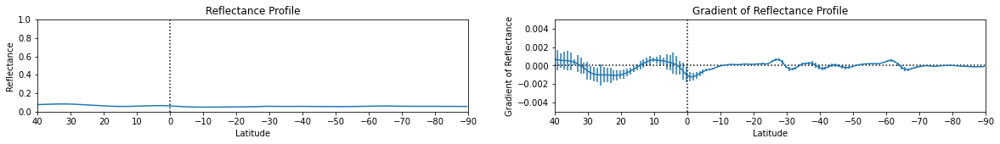

Data Successfully Written to: plotdata/2017_845.csv


In [22]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_24/F845M_24_A.fits')
data = ast.getdata(file,ext=0)*0.00130
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2018 (Cycle 25)

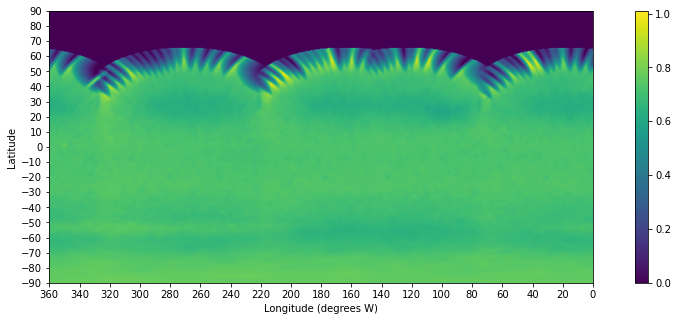

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


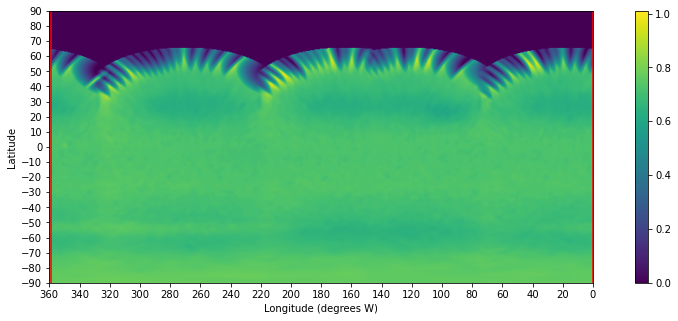

Is this longitude range appropriate? (y/n): y


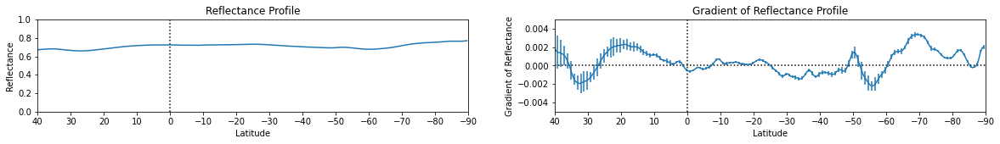

Data Successfully Written to: plotdata/2018_467.csv


In [23]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_25/F467M_25_C.fits')
data = ast.getdata(file,ext=0)*0.00475
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

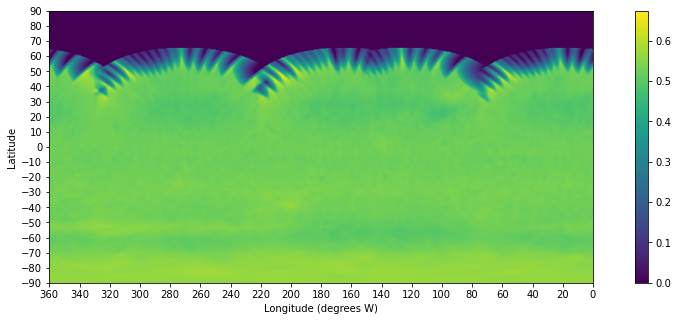

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


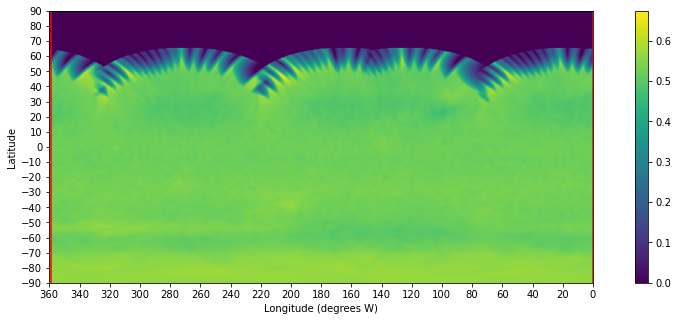

Is this longitude range appropriate? (y/n): y


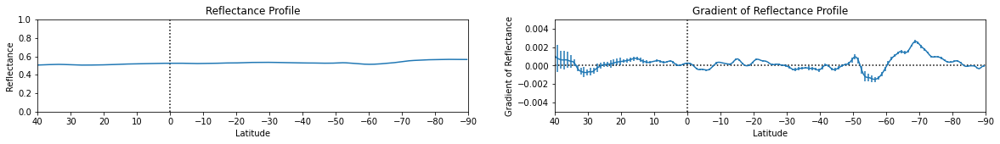

Data Successfully Written to: plotdata/2018_547.csv


In [24]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_25/F547M_25_C.fits')
data = ast.getdata(file,ext=0)*0.00249
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

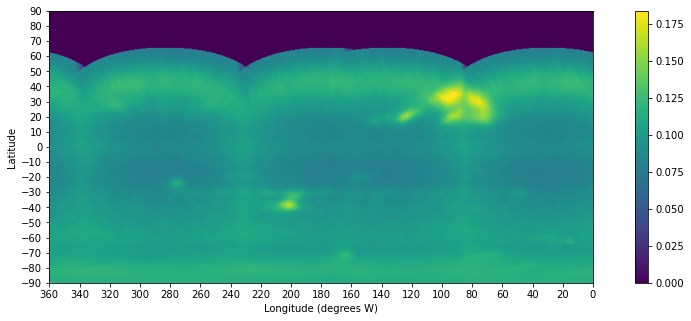

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


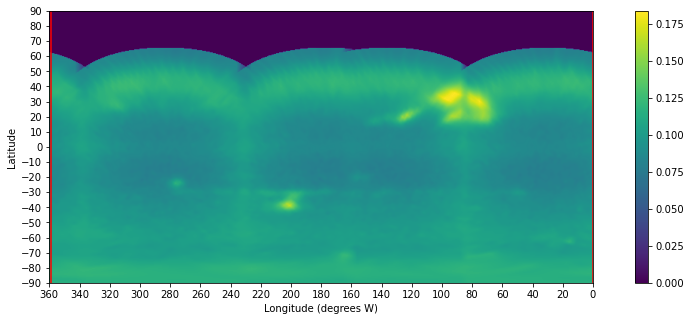

Is this longitude range appropriate? (y/n): y


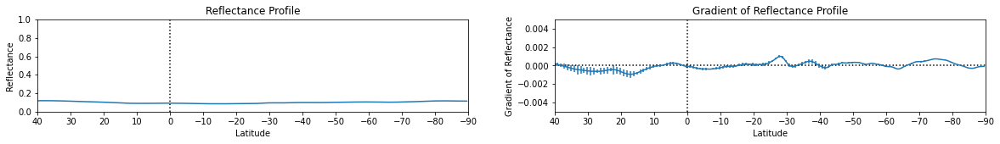

Data Successfully Written to: plotdata/2018_619.csv


In [25]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_25/FQ619N_25_C.fits')
data = ast.getdata(file,ext=0)*0.00160
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

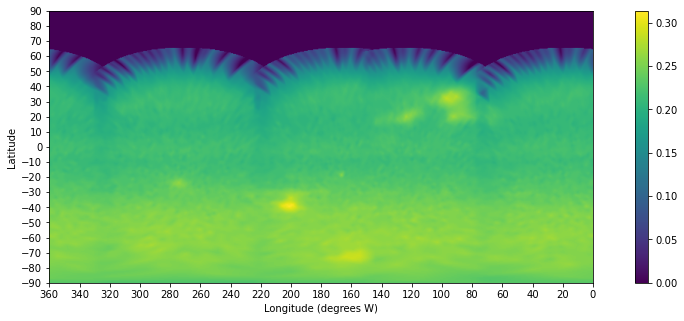

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


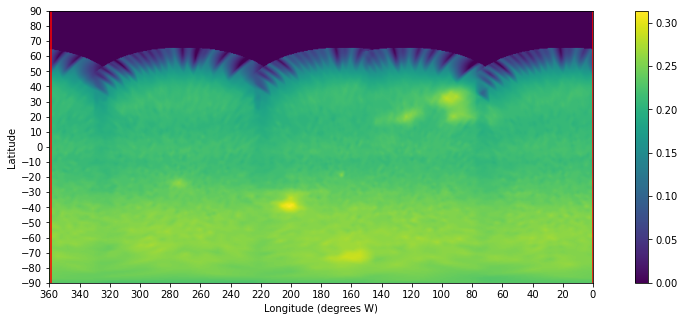

Is this longitude range appropriate? (y/n): y


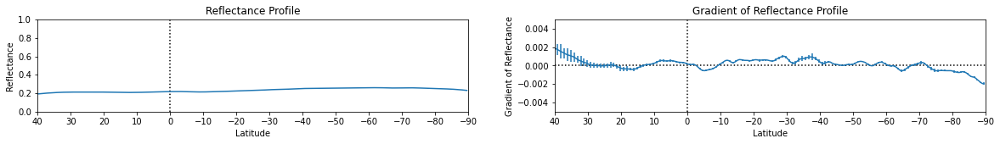

Data Successfully Written to: plotdata/2018_657.csv


In [26]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_25/F657N_25_C.fits')
data = ast.getdata(file,ext=0)*0.00405
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

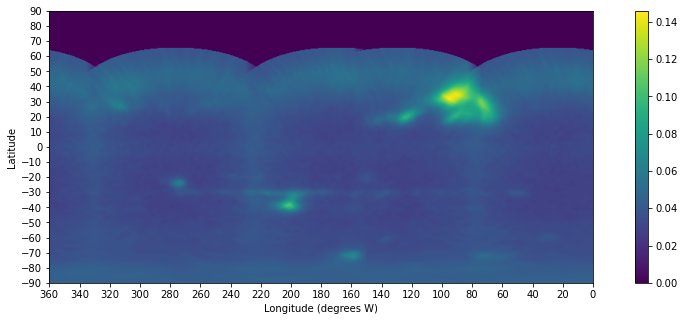

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


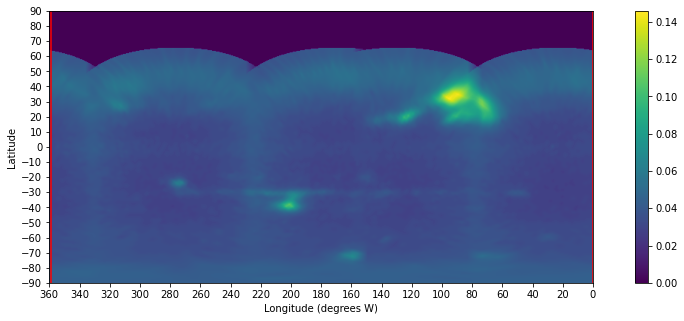

Is this longitude range appropriate? (y/n): y


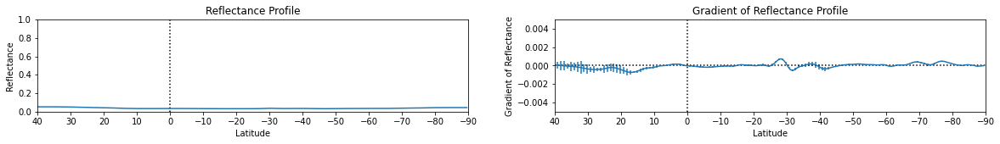

Data Successfully Written to: plotdata/2018_727.csv


In [27]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_25/FQ727N_25_C.fits')
data = ast.getdata(file,ext=0)*0.00203
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

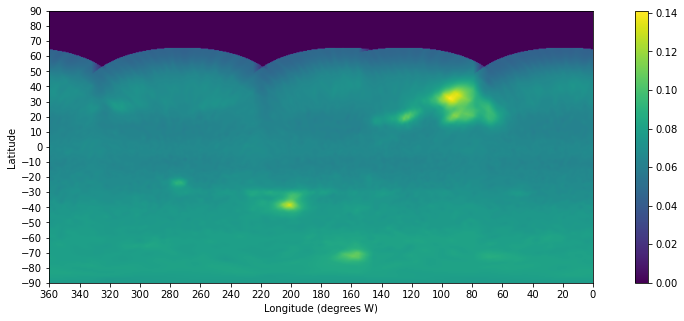

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


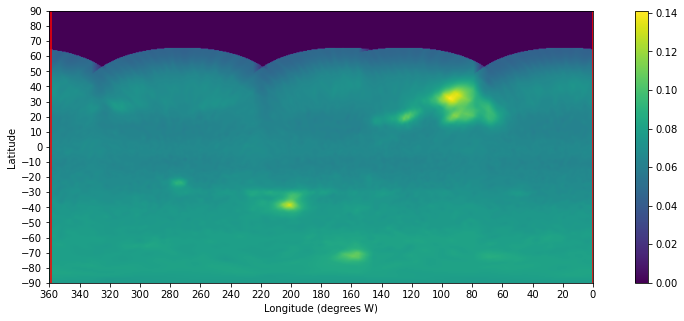

Is this longitude range appropriate? (y/n): y


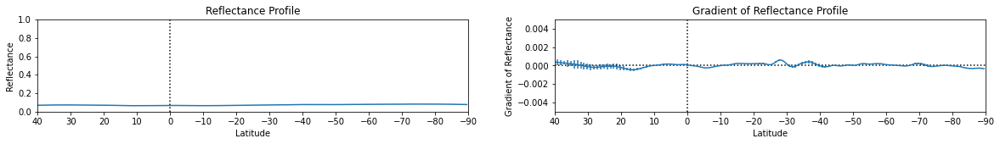

Data Successfully Written to: plotdata/2018_763.csv


In [28]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_25/F763M_25_C.fits')
data = ast.getdata(file,ext=0)*0.00145
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

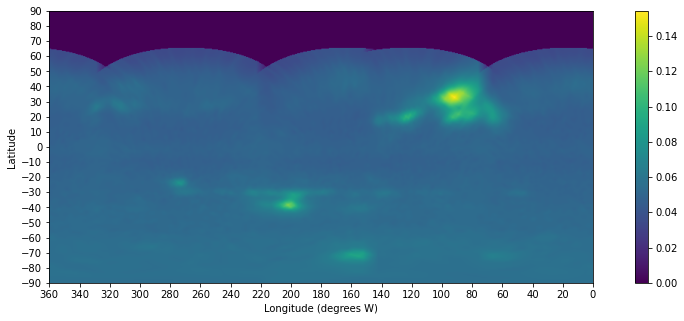

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


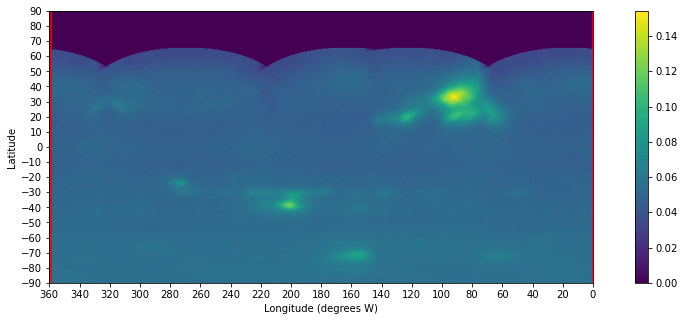

Is this longitude range appropriate? (y/n): y


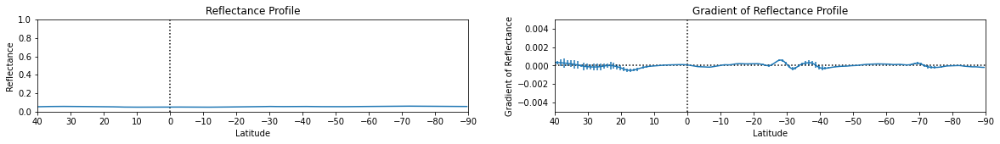

Data Successfully Written to: plotdata/2018_845.csv


In [29]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_25/F845M_25_C.fits')
data = ast.getdata(file,ext=0)*0.00130
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2019 (Cycle 26)

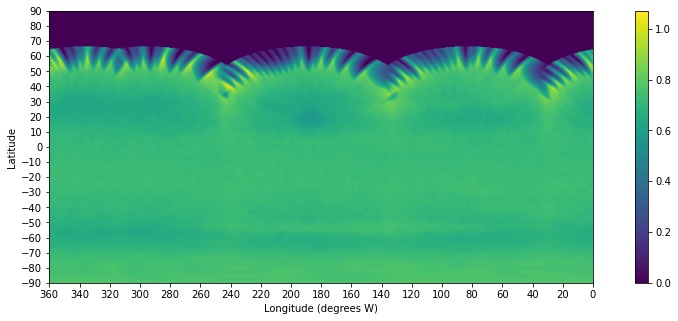

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


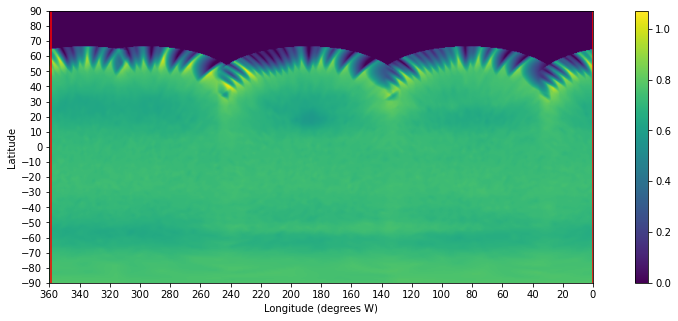

Is this longitude range appropriate? (y/n): y


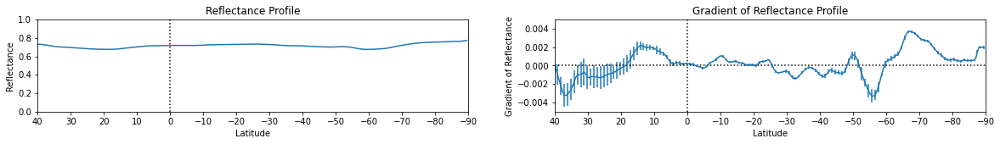

Data Successfully Written to: plotdata/2019_467.csv


In [30]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_26/F467M_26_A.fits')
data = ast.getdata(file,ext=0)*0.00475
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

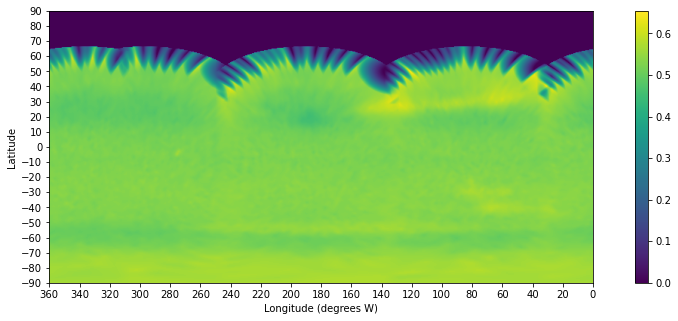

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


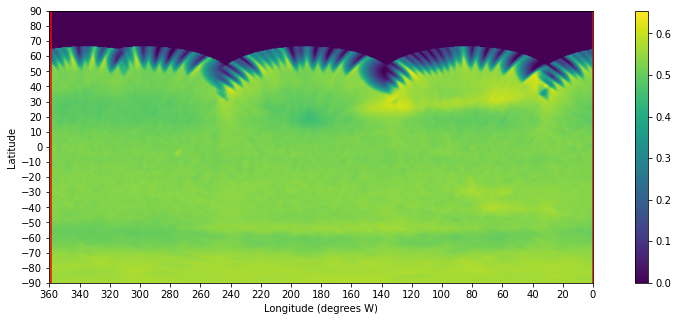

Is this longitude range appropriate? (y/n): y


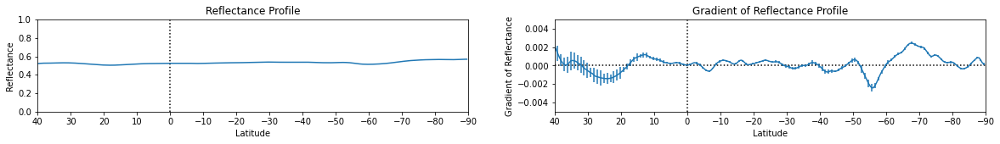

Data Successfully Written to: plotdata/2019_547.csv


In [31]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_26/F547M_26_A.fits')
data = ast.getdata(file,ext=0)*0.00249
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

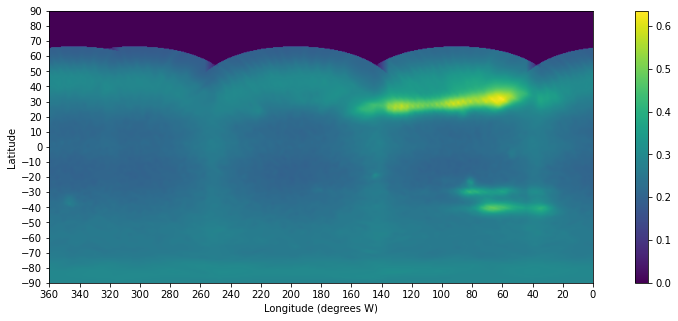

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


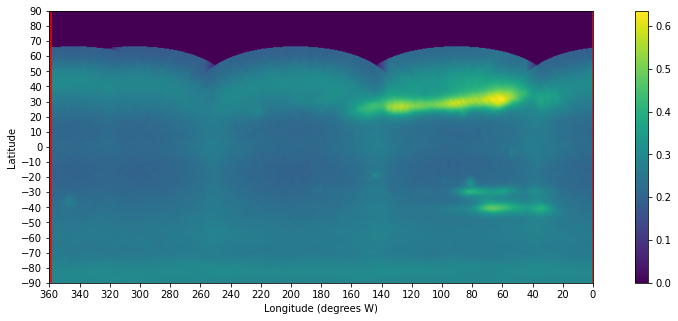

Is this longitude range appropriate? (y/n): y


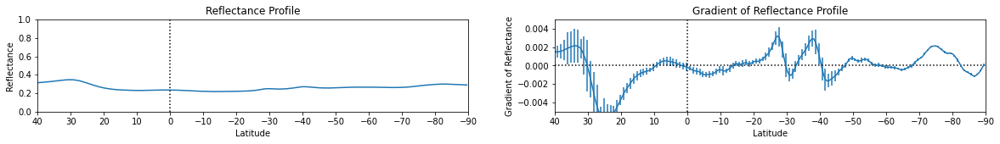

Data Successfully Written to: plotdata/2019_619.csv


In [32]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_26/FQ619N_26_A.fits')
data = ast.getdata(file,ext=0)*0.00160

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

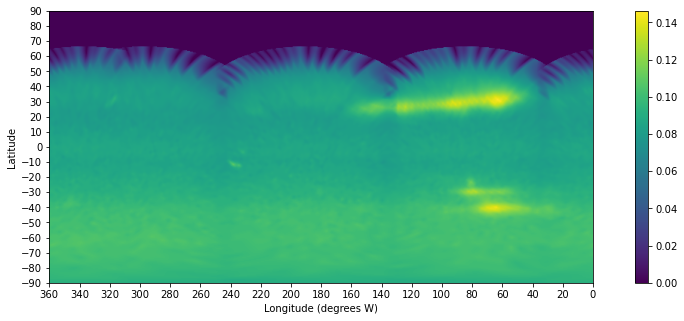

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


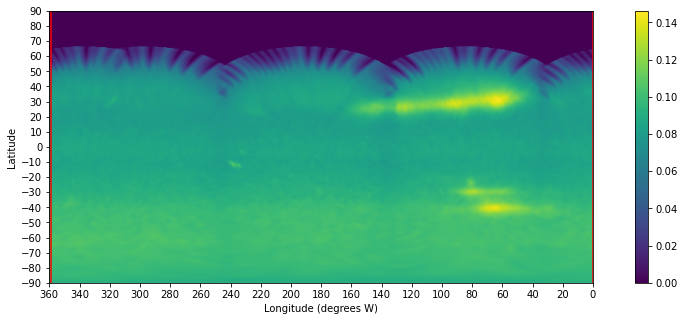

Is this longitude range appropriate? (y/n): y


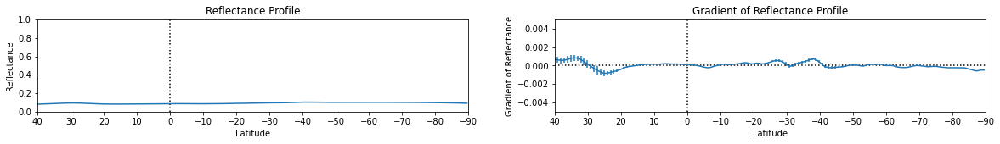

Data Successfully Written to: plotdata/2019_657.csv


In [33]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_26/F657N_26_A.fits')
data = ast.getdata(file,ext=0)*0.00160

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

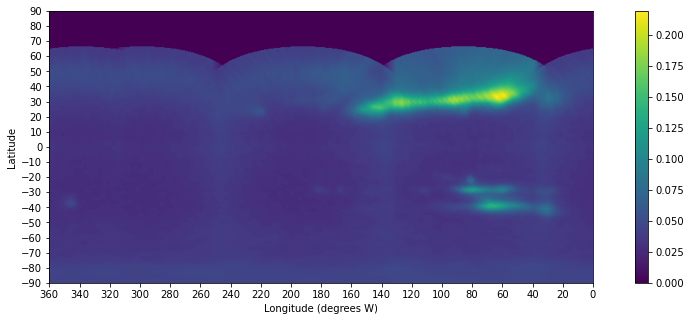

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


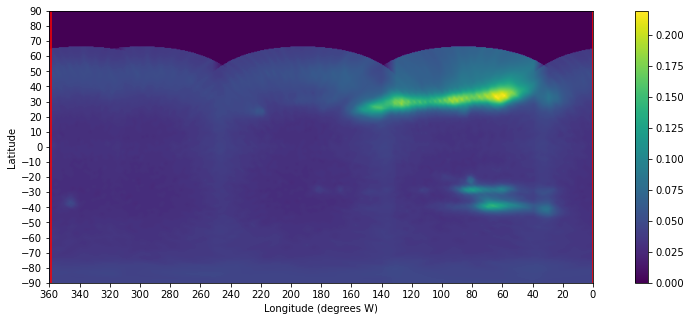

Is this longitude range appropriate? (y/n): y


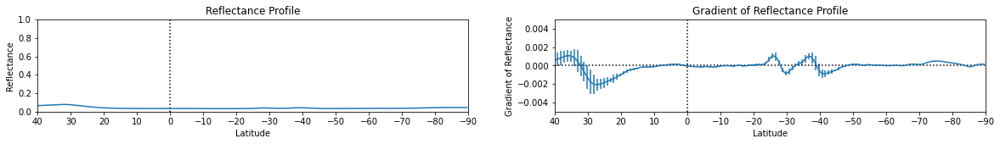

Data Successfully Written to: plotdata/2019_727.csv


In [34]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_26/FQ727N_26_A.fits')
data = ast.getdata(file,ext=0)*0.00203
lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

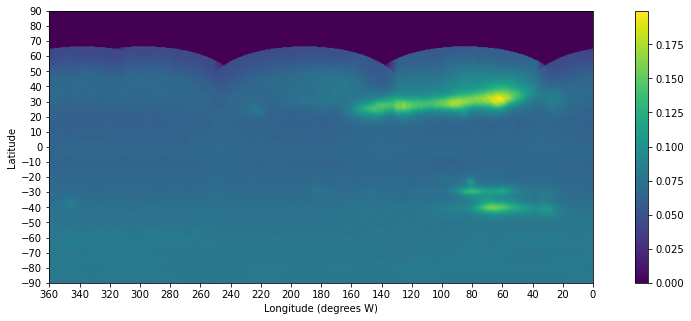

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


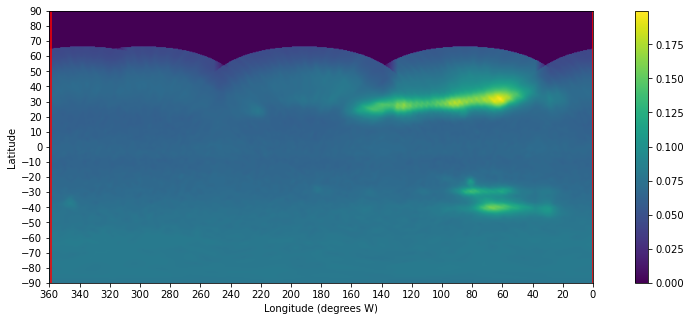

Is this longitude range appropriate? (y/n): y


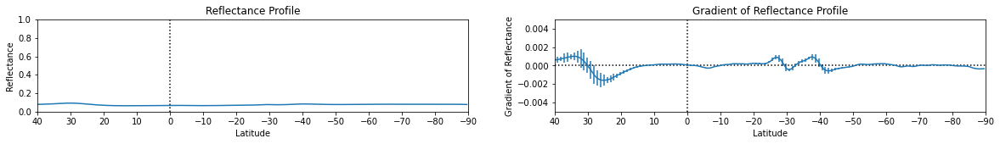

Data Successfully Written to: plotdata/2019_763.csv


In [35]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_26/F763M_26_A.fits')
data = ast.getdata(file,ext=0)*0.00145

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

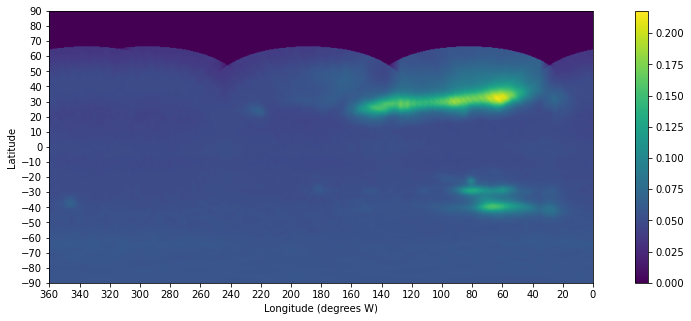

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


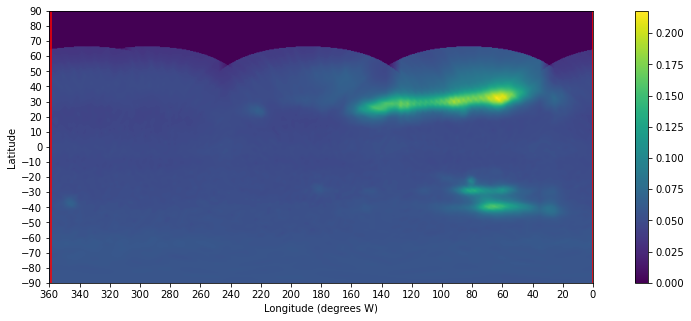

Is this longitude range appropriate? (y/n): y


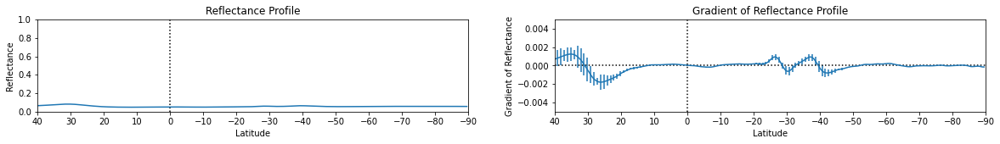

Data Successfully Written to: plotdata/2019_845.csv


In [36]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_26/F845M_26_A.fits')
data = ast.getdata(file,ext=0)*0.00130

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

#This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2020 (Cycle 27)

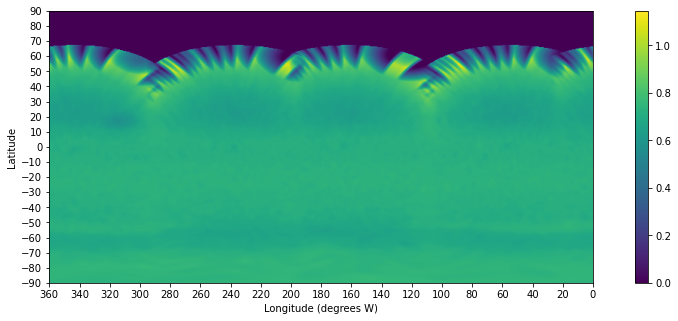

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


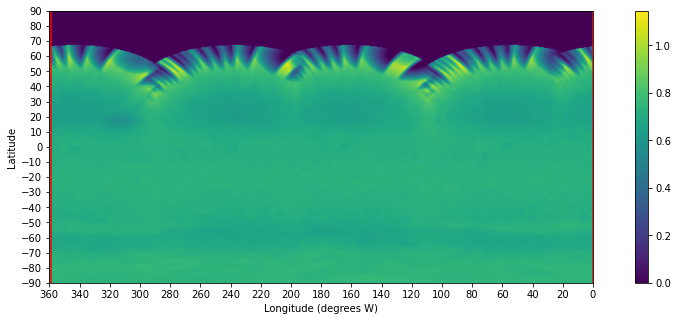

Is this longitude range appropriate? (y/n): y


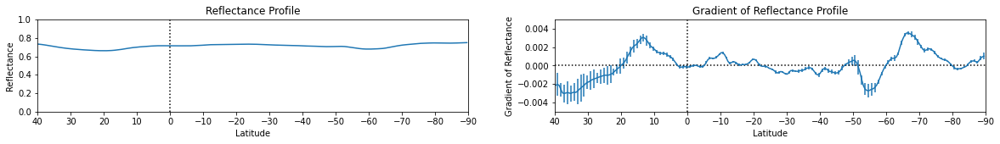

Data Successfully Written to: plotdata/2020_467.csv


In [37]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_27/F467M_27_A.fits')
data = ast.getdata(file,ext=0)*0.00475

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

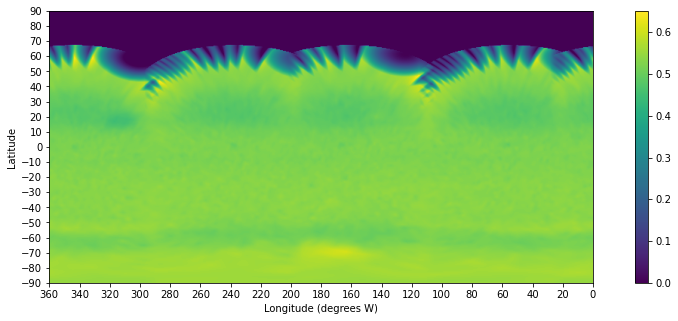

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


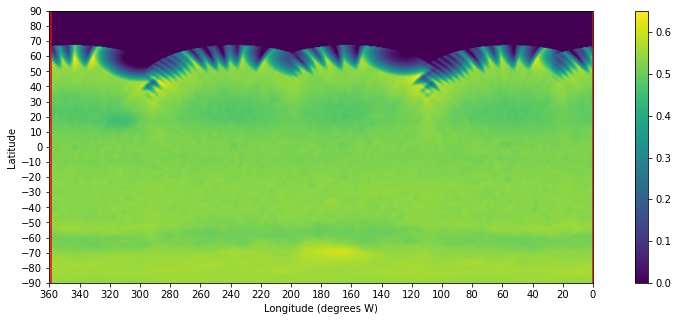

Is this longitude range appropriate? (y/n): y


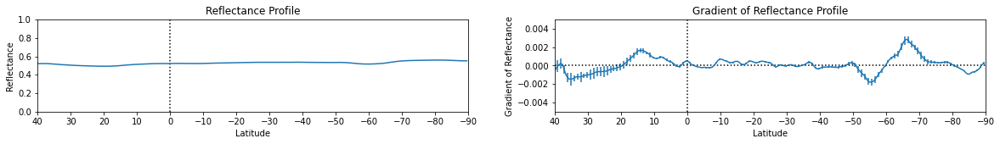

Data Successfully Written to: plotdata/2020_547.csv


In [38]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_27/F547M_27_A.fits')
data = ast.getdata(file,ext=0)*0.00249

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

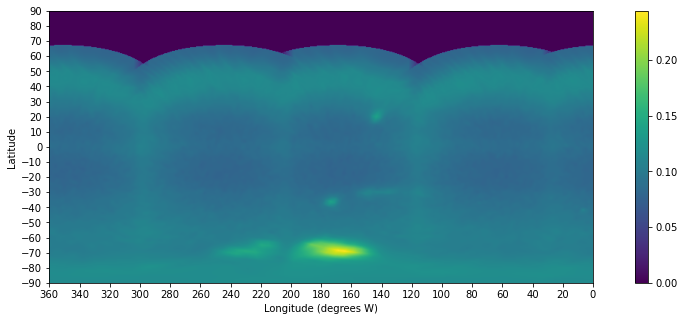

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


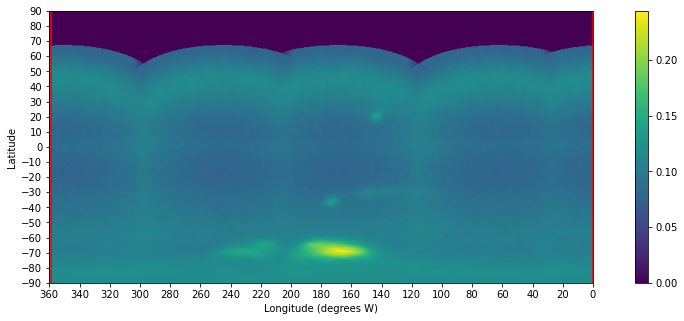

Is this longitude range appropriate? (y/n): y


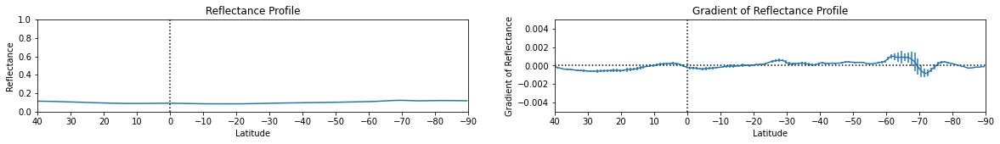

Data Successfully Written to: plotdata/2020_619.csv


In [39]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_27/FQ619N_27_A.fits')
data = ast.getdata(file,ext=0)*0.00160

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

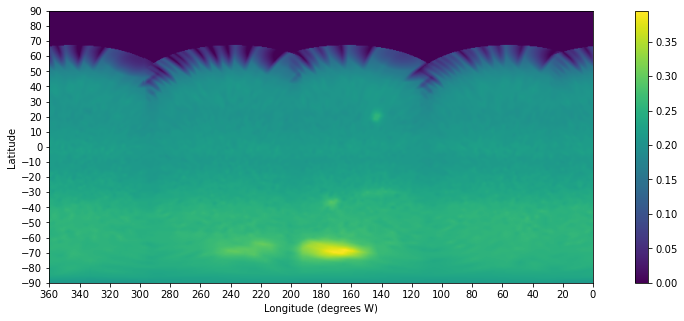

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


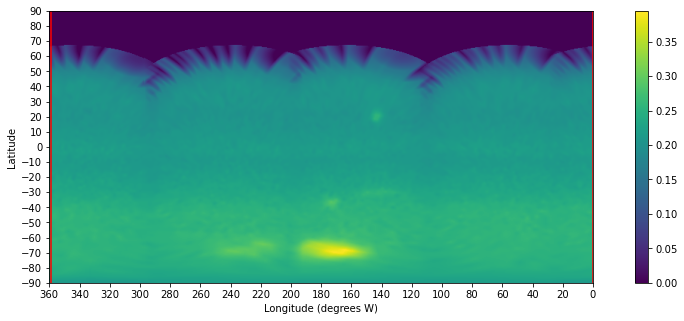

Is this longitude range appropriate? (y/n): y


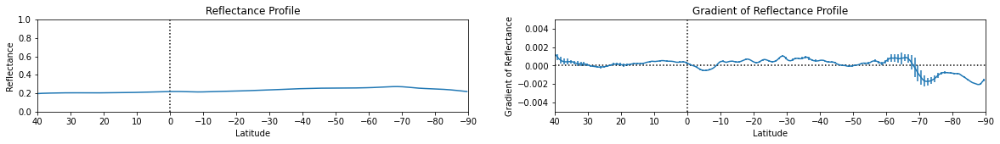

Data Successfully Written to: plotdata/2020_657.csv


In [40]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_27/F657N_27_A.fits')
data = ast.getdata(file,ext=0)*0.00405

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

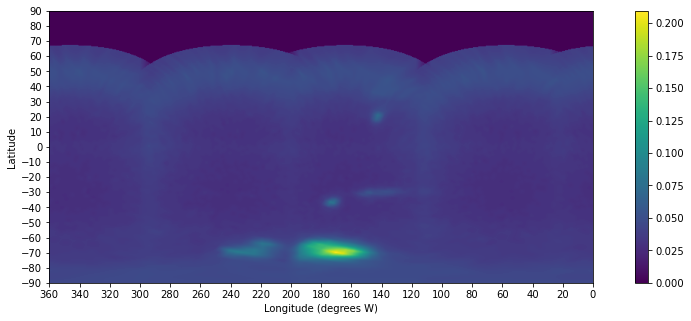

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


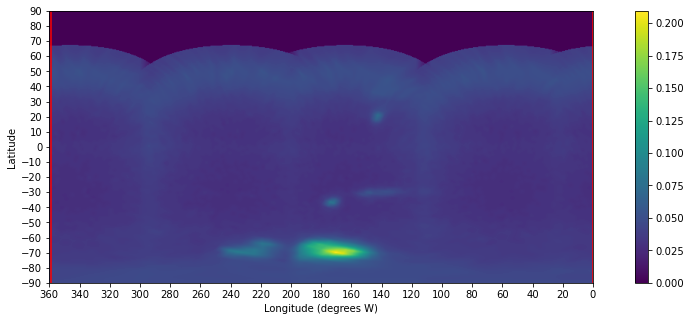

Is this longitude range appropriate? (y/n): y


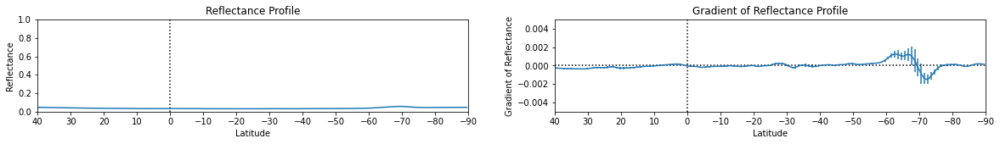

Data Successfully Written to: plotdata/2020_727.csv


In [41]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_27/FQ727N_27_A.fits')
data = ast.getdata(file,ext=0)*0.00203
lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

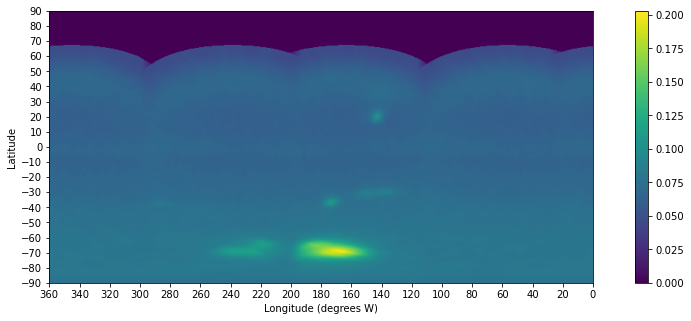

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


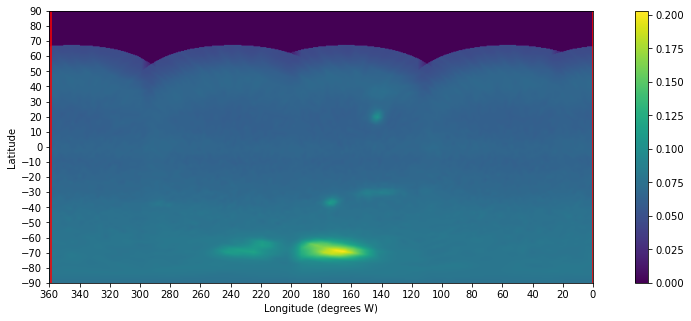

Is this longitude range appropriate? (y/n): y


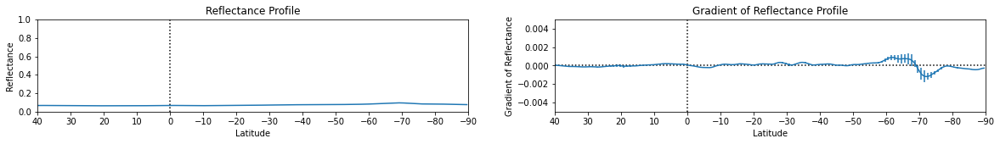

Data Successfully Written to: plotdata/2020_763.csv


In [42]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_27/F763M_27_A.fits')
data = ast.getdata(file,ext=0)*0.00145

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

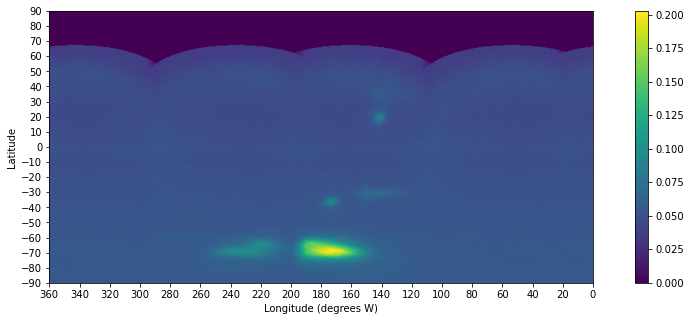

Please input the leftmost longitude of the range desired: 359
Please input the rightmost longitude of the range desired: 0


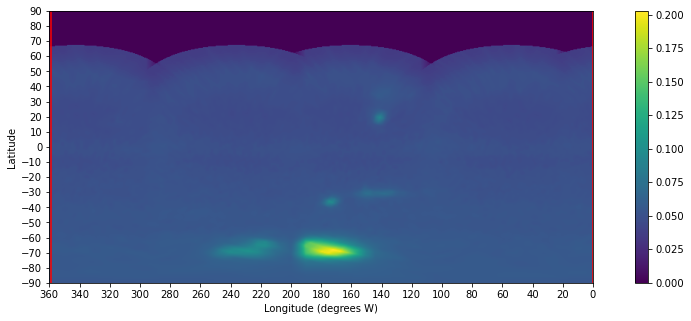

Is this longitude range appropriate? (y/n): y


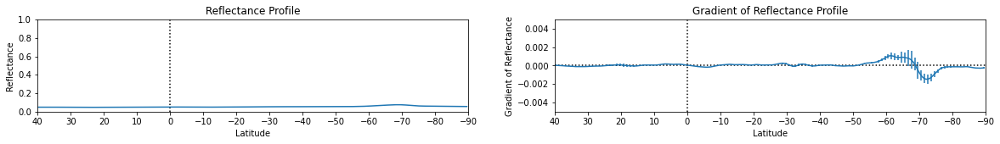

Data Successfully Written to: plotdata/2020_845.csv


In [43]:
good = False
file = get_pkg_data_filename('OPAL_Neptune/Cycle_27/F845M_27_A.fits')
data = ast.getdata(file,ext=0)*0.00130

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
plt.xlabel("Longitude (degrees W)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = float(input('Please input the leftmost longitude of the range desired: '))
    right = float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[360,0,-90,90])
    plt.xlabel("Longitude (degrees W)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

In [ ]:
]